In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch

In [2]:
df = pd.read_csv('C:/Users/Kate/Downloads/uw-madison-gi-tract-image-segmentation/train.csv', dtype=str)
df

,id,class,segmentation
0,case123_day20_slice_0001,large_bowel,NaN
1,case123_day20_slice_0001,small_bowel,NaN
2,case123_day20_slice_0001,stomach,NaN
3,case123_day20_slice_0002,large_bowel,NaN
4,case123_day20_slice_0002,small_bowel,NaN
...,...,...,...
115483,case30_day0_slice_0143,small_bowel,NaN
115484,case30_day0_slice_0143,stomach,NaN
115485,case30_day0_slice_0144,large_bowel,NaN
115486,case30_day0_slice_0144,small_bowel,NaN


In [3]:
df.dropna(subset = ["segmentation"], inplace=True) 
df

,id,class,segmentation
194,case123_day20_slice_0065,stomach,28094 3 28358 7 28623 9 28889 9 29155 9 29421 ...
197,case123_day20_slice_0066,stomach,27561 8 27825 11 28090 13 28355 14 28620 15 28...
200,case123_day20_slice_0067,stomach,15323 4 15587 8 15852 10 16117 11 16383 12 166...
203,case123_day20_slice_0068,stomach,14792 5 15056 9 15321 11 15587 11 15852 13 161...
206,case123_day20_slice_0069,stomach,14526 6 14789 12 15054 14 15319 16 15584 17 15...
...,...,...,...
115459,case30_day0_slice_0135,small_bowel,22540 1 22804 5 23069 7 23334 10 23600 11 2386...
115461,case30_day0_slice_0136,large_bowel,18746 7 19009 23 19038 7 19273 44 19537 49 198...
115462,case30_day0_slice_0136,small_bowel,23079 1 23343 6 23608 9 23874 11 24139 13 2440...
115464,case30_day0_slice_0137,large_bowel,18746 2 19010 8 19040 3 19274 25 19302 12 1953...


In [5]:
a = df["segmentation"]
a

194       28094 3 28358 7 28623 9 28889 9 29155 9 29421 ...
197       27561 8 27825 11 28090 13 28355 14 28620 15 28...
200       15323 4 15587 8 15852 10 16117 11 16383 12 166...
203       14792 5 15056 9 15321 11 15587 11 15852 13 161...
206       14526 6 14789 12 15054 14 15319 16 15584 17 15...
                                ...                        
115459    22540 1 22804 5 23069 7 23334 10 23600 11 2386...
115461    18746 7 19009 23 19038 7 19273 44 19537 49 198...
115462    23079 1 23343 6 23608 9 23874 11 24139 13 2440...
115464    18746 2 19010 8 19040 3 19274 25 19302 12 1953...
115465    21457 6 21722 10 21987 15 22252 18 22517 21 22...
Name: segmentation, Length: 33913, dtype: object

In [6]:
b = a.values.tolist()
b

['28094 3 28358 7 28623 9 28889 9 29155 9 29421 9 29687 9 29953 9 30219 9 30484 10 30750 10 31016 10 31282 10 31548 10 31814 10 32081 9 32347 8 32614 6',
 '27561 8 27825 11 28090 13 28355 14 28620 15 28886 15 29151 17 29417 17 29682 18 29948 18 30214 18 30480 18 30746 18 31012 18 31278 18 31544 18 31811 17 32077 17 32344 15 32610 15 32877 13 33144 11 33411 8',
 '15323 4 15587 8 15852 10 16117 11 16383 12 16649 12 16915 12 17181 12 17447 12 17713 12 17979 12 18245 12 18511 12 18777 12 19043 12 19309 12 19575 12 19841 12 20107 12 20373 12 20639 12 20905 12 21171 12 21437 12 21703 12 21969 12 22235 12 22501 12 22767 12 23033 12 23299 12 23565 12 23831 12 24097 12 24363 12 24629 12 24895 12 25161 13 25427 13 25693 14 25959 14 26224 15 26489 16 26755 17 27020 19 27286 20 27552 21 27818 21 28084 21 28350 22 28616 22 28882 22 29147 23 29413 23 29678 24 29944 24 30210 25 30476 25 30742 25 31008 25 31274 25 31540 25 31806 25 32072 24 32338 24 32604 24 32871 22 33137 22 33403 21 33669 21 33936 1

In [7]:
len(b[0])

149

In [8]:
np.shape(b)

(33913,)

In [9]:
import numpy as np
n = np.array([1, 2, 3, 4, 5, 6])
print(n)
n = n.reshape(-1,2)
print(n)

[1 2 3 4 5 6]
[[1 2]
 [3 4]
 [5 6]]


## RLE decoding function

In [10]:
def decode_rle_to_mask(rle, height = 266, width = 266):
    '''
    rle : run-length as string formated (start value, count)
    height : height of the mask 
    width : width of the mask
    returns binary mask
    '''
    rle = np.array(rle.split(' ')).reshape(-1, 2)
    mask = np.zeros(height*width)
    for i in rle:
        mask[int(i[0]):int(i[0])+int(i[1])] = 1

    return mask.reshape(height, width)

In [11]:
b[0]

'28094 3 28358 7 28623 9 28889 9 29155 9 29421 9 29687 9 29953 9 30219 9 30484 10 30750 10 31016 10 31282 10 31548 10 31814 10 32081 9 32347 8 32614 6'

In [12]:
decode_rle_to_mask(b[0])

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [13]:
from pathlib import Path
basepath = Path('C:/Users/Kate/Downloads/uw-madison-gi-tract-image-segmentation/masks')

for index, row in df.iterrows():
    d = decode_rle_to_mask(row['segmentation'])
    np.save(basepath / row['class'] / f"{row['id']}.npy", d)
#    print(row['id'], row['class'], row['segmentation'])

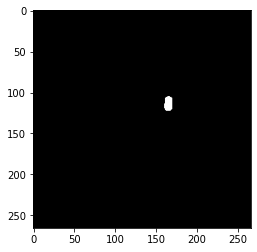

In [14]:
plt.imshow(decode_rle_to_mask(b[0]), cmap='gray')

In [15]:
from pathlib import Path
import numpy as np
basepath = list(Path('C:/Users/Kate/Downloads/uw-madison-gi-tract-image-segmentation/masks').rglob('**/*.npy'))

for path in basepath:
    print(path)
    readmask = np.load(path) 
    if readmask.shape[0] == 266:      
        readmask = readmask[5:-5, 5:-5]
        np.save(path, readmask)

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day20_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day20_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day20_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day20_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day20_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day20_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day20_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day20_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day20_slice_0082.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day26_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day26_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day26_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day26_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day26_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day26_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day26_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day26_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day26_slice_0076.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day32_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day32_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day32_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day32_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day32_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case101_day32_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case102_day0_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case102_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case102_day0_slice_0091.npy
C:\Users\Kate

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day0_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day0_slice_0113.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day21_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day21_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day21_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day21_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day21_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day21_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day21_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day21_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case107_day21_slice_0077.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day0_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day0_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day0_slice_0112.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day13_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day13_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day13_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day13_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day13_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day13_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day13_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day13_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case108_day13_slice_0082.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case110_day12_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case110_day12_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case110_day12_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case110_day12_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case110_day12_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case110_day12_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case110_day12_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case110_day12_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case110_day12_slice_0105.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day0_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day0_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day0_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day0_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day0_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day0_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day0_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day0_slice_0062.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day19_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day19_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day19_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day19_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day19_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day19_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day19_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day19_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case111_day19_slice_0099.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day12_slice_0047.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day12_slice_0048.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day12_slice_0049.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day12_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day12_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day12_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day12_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day12_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day12_slice_0055.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day16_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day16_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day16_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day16_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day16_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day16_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day16_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day16_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day16_slice_0071.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day19_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day19_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day19_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day19_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day19_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day19_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day19_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day19_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case113_day19_slice_0091.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day0_slice_0083.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day15_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day15_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day15_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day15_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day15_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day15_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day17_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day17_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case114_day17_slice_0073.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case115_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case115_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case115_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case115_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case115_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case116_day0_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case116_day0_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case116_day0_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case116_day0_slice_0055.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day0_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day0_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day0_slice_0074.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day13_slice_0045.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day13_slice_0046.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day13_slice_0047.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day13_slice_0048.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day13_slice_0049.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day13_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day13_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day13_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day13_slice_0053.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day16_slice_0032.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day16_slice_0033.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day16_slice_0034.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day16_slice_0035.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day16_slice_0036.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day16_slice_0037.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day16_slice_0038.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day16_slice_0039.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day16_slice_0040.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day17_slice_0041.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day17_slice_0042.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day17_slice_0043.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day17_slice_0044.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day17_slice_0045.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day17_slice_0046.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day17_slice_0047.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day17_slice_0048.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case117_day17_slice_0049.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day14_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day14_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day14_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day14_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day14_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day14_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day14_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day14_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day14_slice_0087.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day16_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day16_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day16_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day16_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day16_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day16_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day16_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day16_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case118_day16_slice_0094.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day0_slice_0114.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day20_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day20_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day20_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day20_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day20_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day20_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day20_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day20_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day20_slice_0109.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day25_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day25_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day25_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day25_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day25_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day25_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day25_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day25_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case119_day25_slice_0097.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day12_slice_0050.npy
C:\Users\Kate\Downloads\uw-

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day13_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day13_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day13_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day13_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day13_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day13_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day13_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day13_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case11_day13_slice_0078.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day0_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day0_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day0_slice_0112.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day16_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day16_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day16_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day16_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day16_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day16_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day16_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day16_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case121_day16_slice_0089.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day0_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day0_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day0_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day0_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day18_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day18_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day18_slice_0052.npy
C:\Users\Kate\Do

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day18_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day24_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day24_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day24_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day24_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day24_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day24_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day24_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day24_slice_0057.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day25_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day25_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day25_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day25_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day25_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day25_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day25_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day25_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day25_slice_0069.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day27_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day27_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day27_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day27_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day27_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day27_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day27_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day27_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case122_day27_slice_0097.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day20_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day20_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day20_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day20_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day20_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day20_slice_0080.npy
C:\Users\Kate

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day22_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day22_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day22_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day22_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day22_slice_0123.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case123_day22_slice_0124.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day0_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day0_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day0_slice_0053.npy
C:\Users\Kate

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day19_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day19_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day19_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day19_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day19_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day19_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day19_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day19_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day19_slice_0069.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day20_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day20_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day20_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day20_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day20_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day20_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day20_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day20_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case124_day20_slice_0092.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day0_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day0_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day0_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day0_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day0_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day0_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day15_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day15_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day15_slice_0069.npy
C:\Users\Kate\Do

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day16_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day16_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day16_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day16_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day16_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day16_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day16_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day16_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case125_day16_slice_0090.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day0_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day0_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day0_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day0_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day0_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day0_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day0_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day0_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day0_slice_0105.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day20_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day20_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day20_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day20_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day20_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day20_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day20_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day20_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day20_slice_0113.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day22_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day22_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day22_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day22_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day22_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day22_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day22_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day22_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day22_slice_0117.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day27_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day27_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day27_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day27_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day27_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day27_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day27_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day27_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case129_day27_slice_0070.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day0_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day0_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day0_slice_0077.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day20_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day20_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day20_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day20_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day20_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day20_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day20_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day20_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day20_slice_0097.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day22_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day22_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day22_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day22_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day22_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day22_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day22_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day22_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case130_day22_slice_0112.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day15_slice_0018.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day15_slice_0019.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day15_slice_0020.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day15_slice_0021.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day15_slice_0022.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day15_slice_0023.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day15_slice_0024.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day15_slice_0025.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day15_slice_0026.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day19_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day19_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day19_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day19_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day19_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day19_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day19_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day19_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day19_slice_0082.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day21_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day21_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day21_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day21_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day21_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day21_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day21_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day21_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day21_slice_0093.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day23_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day23_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day23_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day23_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day23_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day23_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day23_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day23_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case131_day23_slice_0113.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day23_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day23_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day23_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day23_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day23_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day23_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day23_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day23_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day23_slice_0065.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day25_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day25_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day25_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day25_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day25_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day25_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day25_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day25_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case133_day25_slice_0094.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day0_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day0_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day21_slice_0044.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day21_slice_0045.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day21_slice_0046.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day21_slice_0047.npy
C:\Users\Kate\D

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day22_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day22_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day22_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day22_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day22_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day22_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day22_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day22_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case134_day22_slice_0060.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day0_slice_0087.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day17_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day17_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day17_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day17_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day17_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day17_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day17_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day17_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case135_day17_slice_0092.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day25_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day25_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day25_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day25_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day25_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day25_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day25_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day25_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day25_slice_0065.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day27_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day27_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day27_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day27_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day27_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day27_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day27_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day27_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case136_day27_slice_0085.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day11_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day11_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day11_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day11_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day11_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day11_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day11_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day11_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day11_slice_0071.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day12_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day12_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day12_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day12_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day12_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day12_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day12_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day12_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case138_day12_slice_0094.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day14_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day14_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day14_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day14_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day14_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day14_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day14_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day14_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day14_slice_0105.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day18_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day18_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day18_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day18_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day18_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day18_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day18_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day18_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case139_day18_slice_0091.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case140_day10_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case140_day10_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case140_day10_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case140_day10_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case140_day10_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case140_day10_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case140_day10_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case140_day10_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case140_day10_slice_0071.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day0_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day0_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day13_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day13_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day13_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day13_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day13_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day13_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day13_slice_0068.npy
C:\Users\Kat

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day27_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day27_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day27_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day27_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day27_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day27_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day27_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day27_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case141_day27_slice_0084.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day14_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day14_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day14_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day14_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day14_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day14_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day14_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day14_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day14_slice_0082.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day16_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day16_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day16_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day16_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day16_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day16_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day16_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case142_day16_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day0_slice_0058.npy
C:\Users\Ka

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day18_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day18_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day18_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day18_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day18_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day18_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day18_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day18_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day18_slice_0064.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day23_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day23_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day23_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day23_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day23_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day23_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day23_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day23_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case143_day23_slice_0076.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day14_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day14_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day14_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day14_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day14_slice_0067.npy
C:\Users\Kate\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day15_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day15_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day15_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day15_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day15_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day15_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day15_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day15_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case144_day15_slice_0081.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day0_slice_0116.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day20_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day20_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day20_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day20_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day20_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day20_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day20_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day20_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case145_day20_slice_0105.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day24_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day24_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day24_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day24_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day24_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day24_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day24_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day24_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day24_slice_0072.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day25_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day25_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day25_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day25_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day25_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day25_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day25_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day25_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case146_day25_slice_0058.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day14_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day14_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day14_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day14_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day14_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day14_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day14_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day14_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day14_slice_0090.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day19_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day19_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day19_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day19_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day19_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day19_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day19_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day19_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case147_day19_slice_0076.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case148_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case148_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case148_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case148_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case148_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case148_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case148_day0_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case148_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case148_day0_slice_0091.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case148_day20_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case148_day20_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case148_day20_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day0_slice_0070.npy
C:\Users\Kate\Do

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day12_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day12_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day12_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day12_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day12_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day12_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day12_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day12_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case149_day12_slice_0097.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day0_slice_0081.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day14_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day14_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day14_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day14_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day14_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day14_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day14_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day14_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day14_slice_0059.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day16_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day16_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day16_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day16_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day16_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day16_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day16_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day16_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case154_day16_slice_0089.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day0_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day0_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day0_slice_0078.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day11_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day11_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day11_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day11_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day11_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day11_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day11_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day11_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case156_day11_slice_0097.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case15_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case15_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case15_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case15_day20_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case15_day20_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case15_day20_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case15_day20_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case15_day20_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case15_day20_slice_0063.npy
C:\Users\Kate\Download

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case16_day0_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case16_day0_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case16_day0_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case16_day0_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case16_day0_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case16_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case16_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case16_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case16_day0_slice_0064.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day17_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day17_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day17_slice_0058.npy
C:\Users\Kate\Downloads\u

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day19_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day19_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day19_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day19_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day19_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day19_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day19_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day19_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day19_slice_0099.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day21_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day25_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day25_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day25_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day25_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day25_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day25_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day25_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case18_day25_slice_0079.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day0_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day0_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day0_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day0_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day0_slice_0099.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day12_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day12_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day12_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day14_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day14_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day14_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day14_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day14_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day14_slice_0058.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day18_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day18_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day18_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day18_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day18_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day18_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day18_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day18_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day18_slice_0087.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day22_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day22_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day22_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day22_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day22_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day22_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day22_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day22_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case19_day22_slice_0113.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day22_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day22_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day22_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day22_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day22_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day22_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day22_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day22_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day22_slice_0090.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day24_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day24_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day24_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day24_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day24_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day24_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day24_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day24_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case20_day24_slice_0100.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case24_day24_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case24_day24_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case24_day24_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case24_day24_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case24_day24_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case24_day24_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case24_day24_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case24_day24_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case24_day24_slice_0075.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day14_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day14_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day14_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day14_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day14_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day14_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day14_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day14_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case29_day14_slice_0090.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day1_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day1_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day1_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day1_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day1_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day1_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day1_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day1_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day1_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day3_slice_0046.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day3_slice_0047.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day3_slice_0048.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day3_slice_0049.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day3_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day3_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day3_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day3_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day3_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day4_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day4_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day4_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day4_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day4_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day4_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day4_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day4_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day4_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day5_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day5_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day5_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day5_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day5_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day5_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day5_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day5_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case2_day5_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case30_day0_slice_0127.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case30_day0_slice_0128.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case30_day0_slice_0129.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case30_day0_slice_0130.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case30_day0_slice_0131.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case30_day0_slice_0132.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case30_day0_slice_0133.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case30_day0_slice_0134.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case30_day0_slice_0135.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day17_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day17_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day18_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day18_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day18_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day18_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day18_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day18_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day18_slice_0087.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day20_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day20_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day20_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day20_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day20_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day20_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day20_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day20_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case32_day20_slice_0098.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case33_day0_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case33_day0_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case33_day21_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case33_day21_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case33_day21_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case33_day21_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case33_day21_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case33_day21_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case33_day21_slice_0103.npy
C:\Users\Kate\Downloa

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case34_day15_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case34_day15_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case34_day15_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case34_day15_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case34_day15_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case34_day15_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case34_day15_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case34_day15_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case34_day15_slice_0064.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day12_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day12_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day12_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day12_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day12_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day13_slice_0043.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day13_slice_0044.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day13_slice_0045.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day13_slice_0046.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day18_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day18_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day18_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day18_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day18_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case35_day18_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day0_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day0_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day0_slice_0097.npy
C:\Users\Kate\Download

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day10_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day10_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day10_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day10_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day10_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day10_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day10_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day10_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day10_slice_0111.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day14_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day14_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day14_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day14_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day14_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day14_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day14_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day14_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day14_slice_0111.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day16_slice_0124.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day6_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day6_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day6_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day6_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day6_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day6_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day6_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day6_slice_0060.npy
C:\Users\Kate\Downloads\uw-

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day8_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day8_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day8_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day8_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day8_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day8_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day8_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day8_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case36_day8_slice_0099.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day16_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day16_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day16_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day16_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day16_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day16_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day16_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day16_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day16_slice_0084.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day17_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day17_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day17_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day17_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day17_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day17_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day17_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day17_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case40_day17_slice_0119.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case41_day25_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case41_day25_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case41_day25_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case41_day25_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case41_day25_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case41_day25_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case41_day25_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case41_day25_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case41_day25_slice_0079.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day0_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day0_slice_0095.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day17_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day17_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day17_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day17_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day17_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day17_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day17_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day17_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day17_slice_0119.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day19_slice_0125.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day19_slice_0126.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day19_slice_0127.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case42_day19_slice_0128.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day0_slice_0082.npy
C:\Users\Kate\Downloads\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day18_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day18_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day18_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day18_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day18_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day18_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day18_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day18_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day18_slice_0100.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day22_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day22_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day22_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day22_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day22_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day22_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day22_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day22_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case43_day22_slice_0104.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day19_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day19_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day19_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day19_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day19_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day19_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day19_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day19_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day19_slice_0076.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day20_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day20_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day20_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day20_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day20_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day20_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day20_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day20_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case44_day20_slice_0115.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day27_slice_0036.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day27_slice_0037.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day27_slice_0038.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day27_slice_0039.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day27_slice_0040.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day27_slice_0041.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day27_slice_0042.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day27_slice_0043.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day27_slice_0044.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day29_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day29_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day29_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day29_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day29_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day29_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day29_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day29_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case47_day29_slice_0060.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case49_day13_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case49_day13_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case49_day13_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case49_day13_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case49_day13_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case49_day13_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case49_day13_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case49_day13_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case49_day13_slice_0084.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case53_day0_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case53_day0_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case53_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case53_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case53_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case53_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case53_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case53_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case53_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day0_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day30_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day30_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day30_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day30_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day30_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day30_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day30_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day30_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day30_slice_0082.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day35_slice_0049.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day35_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day35_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day35_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day35_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day35_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day35_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day35_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day35_slice_0057.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day39_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day39_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day39_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day39_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day39_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day39_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day39_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day39_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case54_day39_slice_0085.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case55_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case55_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case55_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case55_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case55_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case55_day0_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case55_day0_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case55_day0_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case55_day0_slice_0119.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case58_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case58_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case58_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case58_day0_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case58_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case58_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case58_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case58_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case58_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day0_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day0_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day0_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day0_slice_0119.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day22_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day22_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day22_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day22_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day22_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day22_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day22_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day22_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case63_day22_slice_0083.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day0_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day0_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day0_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day0_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day0_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day0_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day25_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day25_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day25_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day25_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day25_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day25_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day25_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day25_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case65_day25_slice_0097.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day0_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day0_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day0_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day0_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day0_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day0_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day34_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day34_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day34_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day34_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day34_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day34_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day34_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day34_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case66_day34_slice_0123.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day0_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day12_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day12_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day12_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day12_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day12_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day12_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day12_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day12_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case67_day12_slice_0102.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day24_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day24_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day24_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day24_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day24_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day24_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day24_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day24_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case6_day24_slice_0090.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day15_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day15_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day15_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day15_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day15_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day15_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day15_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day15_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day15_slice_0101.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day19_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day19_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day19_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day19_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day19_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day19_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case74_day19_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case77_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case77_day0_slice_0073.npy
C:\Users\Kate\Downloa

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case77_day20_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case77_day20_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case77_day20_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case77_day20_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case77_day20_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case77_day20_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case78_day0_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case78_day0_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case78_day0_slice_0102.npy
C:\Users\Kate\Download

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case78_day26_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case78_day26_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case78_day26_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case78_day26_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case78_day26_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case78_day26_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case78_day26_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case78_day26_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case78_day26_slice_0112.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case7_day13_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case7_day13_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case7_day13_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case7_day13_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case7_day13_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case7_day13_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case7_day13_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case7_day13_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case7_day13_slice_0084.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day0_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day0_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day0_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day0_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day0_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day0_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day0_slice_0101.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day14_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day14_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day14_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day14_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day14_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day14_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day14_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day14_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case80_day14_slice_0103.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case81_day28_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case81_day28_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case81_day28_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case81_day28_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case81_day28_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case81_day28_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case81_day28_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case81_day28_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case81_day28_slice_0077.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day0_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day0_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day0_slice_0123.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day0_slice_0124.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day0_slice_0125.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day0_slice_0126.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day0_slice_0127.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day21_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day21_slice_0088.npy
C:\Users\Kate\Downloads\uw

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day23_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day23_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day23_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day23_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day23_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case84_day23_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day0_slice_0084.npy
C:\Users\Kate\Download

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day21_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day21_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day21_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day21_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day21_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day21_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day21_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day21_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day21_slice_0119.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day27_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day27_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day27_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day27_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day27_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day27_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day27_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day27_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case85_day27_slice_0120.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case88_day0_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case88_day36_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case88_day36_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case88_day36_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case88_day36_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case88_day36_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case88_day36_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case88_day36_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case88_day36_slice_0094.npy
C:\Users\Kate\Downlo

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day17_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day17_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day17_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day17_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day17_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day19_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day19_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day19_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day19_slice_0061.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day21_slice_0020.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day21_slice_0021.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day21_slice_0022.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day21_slice_0023.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day21_slice_0024.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day21_slice_0025.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day21_slice_0026.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day21_slice_0027.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case89_day21_slice_0028.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case90_day0_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case90_day0_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case90_day0_slice_0123.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case90_day0_slice_0124.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case90_day22_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case90_day22_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case90_day22_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case90_day22_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case90_day22_slice_0100.npy
C:\Users\Kate\Downloads

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case91_day0_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case91_day0_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case91_day0_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case91_day0_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case91_day0_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case91_day0_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case91_day0_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case91_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case91_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day0_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day0_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day0_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day20_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day20_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day20_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day20_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day20_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day20_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day20_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day20_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\large_bowel\case9_day20_slice_0097.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day20_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day20_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day20_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day20_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day20_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day20_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day20_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day20_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day20_slice_0101.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day26_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day26_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day26_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day26_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day26_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day26_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day26_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day26_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case101_day26_slice_0120.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day0_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day0_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day0_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day19_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day19_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day19_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day19_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day19_slice_0071.npy
C:\Users\Kate\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day21_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day21_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day21_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day21_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day21_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day21_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day21_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day21_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case107_day21_slice_0099.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case108_day10_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case108_day10_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case108_day10_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case108_day10_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case108_day10_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case108_day10_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case108_day10_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case108_day10_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case108_day10_slice_0112.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case110_day12_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case110_day12_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case110_day12_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case110_day12_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case110_day12_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case110_day12_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case110_day12_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case110_day12_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case110_day12_slice_0091.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case111_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case111_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case111_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case111_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case111_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case111_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case111_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case111_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case111_day0_slice_0089.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day0_slice_0088.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day16_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day16_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day16_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day16_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day16_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day16_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day16_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day16_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day16_slice_0082.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day22_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day22_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day22_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day22_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day22_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day22_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day22_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day22_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case113_day22_slice_0087.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day15_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day15_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day15_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day15_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day15_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day15_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day15_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day15_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day15_slice_0083.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day17_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day17_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day17_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day17_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day17_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day17_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day17_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day17_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case114_day17_slice_0104.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case116_day0_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case116_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case116_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case116_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case116_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case116_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case116_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case116_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case116_day0_slice_0113.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day13_slice_0044.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day13_slice_0045.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day13_slice_0046.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day13_slice_0047.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day13_slice_0048.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day13_slice_0049.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day13_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day13_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day13_slice_0052.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day16_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day16_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day16_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day16_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day16_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day16_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day16_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day16_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case117_day16_slice_0063.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day0_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day0_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day0_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day0_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day0_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day0_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day0_slice_0063.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day16_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day16_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day16_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day16_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day16_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day16_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day16_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day16_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case118_day16_slice_0076.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day0_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day0_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day0_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day0_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day0_slice_0110.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day20_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day20_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day20_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day20_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day21_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day21_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day21_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day21_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case119_day21_slice_0078.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day13_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day13_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day13_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day13_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day13_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day13_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day13_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day13_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case11_day13_slice_0070.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day0_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day0_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day0_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day0_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day0_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day0_slice_0121.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day16_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day16_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day16_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day16_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case121_day16_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day0_slice_0077.npy
C:\Users\Kate\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day18_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day18_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day18_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day18_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day18_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day18_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day18_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day18_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day18_slice_0111.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day25_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day25_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day25_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day25_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day25_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day25_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day25_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day25_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day25_slice_0096.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day27_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day27_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day27_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day27_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day27_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day27_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day27_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case122_day27_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case123_day0_slice_0071.npy
C:\Users\Ka

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case123_day20_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case123_day20_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case123_day20_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case123_day20_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case123_day20_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case123_day20_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case123_day22_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case123_day22_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case123_day22_slice_0085.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day0_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day0_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day0_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day0_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day0_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day19_slice_0074.npy
C:\Users\Kate\Down

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day20_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day20_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day20_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day20_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day20_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day20_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case124_day20_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case125_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case125_day0_slice_0066.npy
C:\Users\Kat

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case125_day15_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case125_day15_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case125_day15_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case125_day15_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case125_day15_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case125_day15_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case125_day15_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case125_day15_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case125_day15_slice_0099.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day0_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day0_slice_0095.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day22_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day22_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day22_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day22_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day22_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day22_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day22_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day22_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day22_slice_0096.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day27_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day27_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day27_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day27_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day27_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day27_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day27_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day27_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case129_day27_slice_0085.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day0_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day0_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day0_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day0_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day0_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day0_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day0_slice_0108.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day22_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day22_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day22_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day22_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day22_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day22_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day22_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day22_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case130_day22_slice_0100.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day15_slice_0039.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day15_slice_0040.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day15_slice_0041.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day15_slice_0042.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day15_slice_0043.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day15_slice_0044.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day15_slice_0045.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day15_slice_0046.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day15_slice_0047.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day21_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day21_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day21_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day21_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day21_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day21_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day21_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day21_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day21_slice_0074.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day23_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day23_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day23_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day23_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day23_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day23_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day23_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day23_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case131_day23_slice_0110.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case133_day23_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case133_day23_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case133_day23_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case133_day23_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case133_day23_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case133_day23_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case133_day23_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case133_day23_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case133_day23_slice_0111.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day0_slice_0085.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day21_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day21_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day21_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day21_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day21_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day21_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day21_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day21_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case134_day21_slice_0113.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case135_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case135_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case135_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case135_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case135_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case135_day0_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case135_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case135_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case135_day0_slice_0092.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case135_day17_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day0_slice_0085.npy
C:\Users\Kate\Down

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day27_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day27_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day27_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day27_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day27_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day27_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day27_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day27_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case136_day27_slice_0095.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day0_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day0_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day0_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day0_slice_0123.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day0_slice_0124.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day0_slice_0125.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day0_slice_0126.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day11_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day11_slice_0058.npy
C:\Users\Kate\Dow

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day12_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day12_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day12_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day12_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day12_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case138_day12_slice_0123.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day0_slice_0077.npy
C:\Users\Kate

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day16_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day16_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day16_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day16_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day16_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day16_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day16_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day16_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day16_slice_0070.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day18_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day18_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day18_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day18_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day18_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day18_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day18_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day18_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case139_day18_slice_0089.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case140_day10_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case140_day10_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day0_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day0_slice_0067.npy
C:\Users\Kate\Dow

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day13_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day13_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day13_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day13_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day13_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day13_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day13_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day13_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case141_day13_slice_0109.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day0_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day0_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day0_slice_0112.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day16_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day16_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day16_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day16_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day16_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day16_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day16_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day16_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case142_day16_slice_0093.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case143_day18_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case143_day18_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case143_day18_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case143_day18_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case143_day18_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case143_day18_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case143_day18_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case143_day18_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case143_day18_slice_0089.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day0_slice_0086.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day14_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day14_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day14_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day15_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day15_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day15_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day15_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day15_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case144_day15_slice_0070.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case145_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case145_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case145_day0_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case145_day0_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case145_day19_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case145_day19_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case145_day19_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case145_day19_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case145_day19_slice_0082.npy
C:\Users\Kate\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day0_slice_0084.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day24_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day24_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day24_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day24_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day24_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day24_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day24_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day24_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case146_day24_slice_0113.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day14_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day14_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day14_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day14_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day14_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day14_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day14_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day14_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day14_slice_0098.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day19_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day19_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day19_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day19_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day19_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day19_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day19_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day19_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case147_day19_slice_0099.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case148_day0_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case148_day0_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case148_day20_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case148_day20_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case148_day20_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case148_day20_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case148_day20_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case148_day20_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case148_day20_slice_0087.npy
C:\Users\Kat

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case149_day12_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case149_day12_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case149_day12_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case149_day12_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case149_day12_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case149_day12_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case149_day12_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case149_day12_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case149_day12_slice_0095.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day0_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day0_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day0_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day0_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day0_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day0_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day13_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day13_slice_0063.npy
C:\Users\Kate\Dow

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day14_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day14_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day14_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day14_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day14_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day14_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day14_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day14_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day14_slice_0096.npy
C:\Users\K

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day17_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day17_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case154_day17_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case156_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case156_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case156_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case156_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case156_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case156_day0_slice_0077.npy
C:\Users\Kate\Do

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case156_day11_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case156_day11_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case156_day11_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case156_day11_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case156_day11_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case156_day11_slice_0123.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case156_day11_slice_0124.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case15_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case15_day0_slice_0075.npy
C:\Users\Kate\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case15_day20_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case15_day20_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case15_day20_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case15_day20_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case15_day20_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case15_day20_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case15_day20_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case15_day20_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case15_day20_slice_0112.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day0_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day19_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day19_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day19_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day19_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day19_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day19_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day19_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day19_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day19_slice_0093.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day21_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day21_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day21_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day21_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day21_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day21_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day21_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day21_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case18_day21_slice_0113.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day0_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day12_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day12_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day12_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day12_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day12_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day12_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day14_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day14_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day14_slice_0061.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day18_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day18_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day18_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day18_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day18_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day18_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day18_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day18_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case19_day18_slice_0090.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day0_slice_0089.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day22_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day22_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day22_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day22_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day22_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day22_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day22_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day22_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case20_day22_slice_0118.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case22_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case22_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case22_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case22_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case22_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case22_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case22_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case22_day0_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case22_day0_slice_0117.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case24_day24_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case24_day24_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case24_day24_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case24_day24_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case24_day24_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case24_day24_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case24_day24_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case24_day24_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case24_day24_slice_0092.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case29_day0_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case29_day0_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case29_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case29_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case29_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case29_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case29_day13_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case29_day13_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case29_day13_slice_0087.npy
C:\Users\Kate\Downloads\u

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day1_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day1_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day1_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day1_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day1_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day1_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day1_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day1_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day1_slice_0123.npy
C:\Users\Kate\Downloads\uw-madison-gi

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day3_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day3_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day3_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day3_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day3_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day3_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day3_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day3_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day3_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day5_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day5_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day5_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day5_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day5_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day5_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day5_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day5_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case2_day5_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case30_day1_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case30_day1_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case30_day1_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case30_day1_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case30_day1_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case30_day1_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case30_day1_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case30_day1_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case30_day1_slice_0105.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case32_day17_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case32_day17_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case32_day17_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case32_day17_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case32_day17_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case32_day18_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case32_day18_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case32_day18_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case32_day18_slice_0105.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case33_day0_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case33_day0_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case33_day0_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case33_day0_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case33_day0_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case33_day0_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case33_day0_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case33_day0_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case33_day0_slice_0104.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case34_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case34_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case34_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case34_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case34_day15_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case34_day15_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case34_day15_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case34_day15_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case34_day15_slice_0058.npy
C:\Users\Kate\Downloads

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day15_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day15_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day15_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day15_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day15_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day15_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day15_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day15_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case35_day15_slice_0060.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day10_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day10_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day10_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day10_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day10_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day10_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day10_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day10_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day10_slice_0075.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day14_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day14_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day14_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day14_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day14_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day14_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day14_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day14_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day14_slice_0082.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day16_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day16_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day16_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day16_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day16_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day16_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day16_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day16_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day16_slice_0107.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day6_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day6_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day6_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day6_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day8_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day8_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day8_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day8_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case36_day8_slice_0066.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day0_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day0_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day0_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day0_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day17_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day17_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day17_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day17_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day17_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day17_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day17_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day17_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case40_day17_slice_0116.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case41_day32_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case41_day32_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case41_day32_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case41_day32_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case41_day32_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case41_day32_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case41_day32_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case41_day32_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case41_day32_slice_0112.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case42_day17_slice_0125.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case42_day17_slice_0126.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case42_day17_slice_0127.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case42_day17_slice_0128.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case42_day17_slice_0129.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case42_day17_slice_0130.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case42_day17_slice_0131.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case42_day17_slice_0132.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case42_day17_slice_0133.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day0_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day0_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day0_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day0_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day0_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day0_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day18_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day18_slice_0058.npy
C:\Users\Kate\Downloads\uw

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day20_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day20_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day20_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day20_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day20_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day20_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day20_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day20_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day20_slice_0100.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day26_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day26_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day26_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day26_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day26_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day26_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day26_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day26_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case43_day26_slice_0090.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day0_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day0_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day0_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day0_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day0_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day19_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day19_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day19_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day19_slice_0073.npy
C:\Users\Kate\Downloads\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day20_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day20_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day20_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day20_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day20_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day20_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day20_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day20_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case44_day20_slice_0114.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case47_day27_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case47_day27_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case47_day27_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case47_day27_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case47_day27_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case47_day27_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case47_day27_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case47_day27_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case47_day27_slice_0086.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case49_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case49_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case49_day0_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case49_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case49_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case49_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case49_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case49_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case49_day13_slice_0076.npy
C:\Users\Kate\Downloads\uw-

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case49_day15_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case53_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case53_day0_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case53_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case53_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case53_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case53_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case53_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case53_day0_slice_0095.npy
C:\Users\Kate\Downloads\uw-

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day0_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day0_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day0_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day0_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day0_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day0_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day0_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day0_slice_0102.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day32_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day32_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day32_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day32_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day32_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day32_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day32_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day32_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day32_slice_0090.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day39_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day39_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day39_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day39_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day39_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day39_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day39_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day39_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case54_day39_slice_0107.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case55_day18_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case55_day18_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case55_day18_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case55_day18_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case55_day18_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case55_day18_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case55_day18_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case55_day18_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case55_day18_slice_0122.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case58_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case58_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case58_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case58_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case58_day0_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day20_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day20_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day20_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day20_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day20_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day20_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day20_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day20_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day20_slice_0110.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day26_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day26_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day26_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day26_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day26_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day26_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day26_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day26_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case63_day26_slice_0119.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case65_day25_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case65_day25_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case65_day25_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case65_day25_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case65_day25_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case65_day25_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case65_day25_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case65_day25_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case65_day25_slice_0114.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case66_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case66_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case66_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case66_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case66_day0_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case66_day0_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case66_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case66_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case66_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day0_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day0_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day12_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day12_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day12_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day12_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day12_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day12_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day12_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day12_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case67_day12_slice_0104.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day0_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day0_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day0_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day0_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day0_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day0_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day0_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day24_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day24_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day24_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day24_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case6_day24_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case74_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case74_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case74_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case74_day0_slice_0095.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case74_day18_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case74_day18_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case74_day18_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case74_day18_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case74_day19_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case74_day19_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case74_day19_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case74_day19_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case74_day19_slice_0097.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case77_day18_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case77_day18_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case77_day18_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case77_day18_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case77_day18_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case77_day18_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case77_day18_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case77_day18_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case77_day18_slice_0117.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case78_day22_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case78_day22_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case78_day22_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case78_day22_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case78_day22_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case78_day22_slice_0110.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case78_day22_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case78_day22_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case78_day22_slice_0113.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case7_day13_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case7_day13_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case7_day13_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case7_day13_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case7_day13_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case7_day13_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case7_day13_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case7_day13_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case7_day13_slice_0090.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case80_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case80_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case80_day0_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case80_day10_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case80_day10_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case80_day10_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case80_day10_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case80_day10_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case80_day10_slice_0093.npy
C:\Users\Kate\Download

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day28_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day28_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day30_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day30_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day30_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day30_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day30_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day30_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case81_day30_slice_0073.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case84_day0_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case84_day0_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case84_day0_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case84_day0_slice_0123.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case84_day0_slice_0124.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case84_day0_slice_0125.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case84_day0_slice_0126.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case84_day0_slice_0127.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case84_day21_slice_0089.npy
C:\Users\Kate\Downloads\uw-

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day0_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day0_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day0_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day0_slice_0098.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day23_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day23_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day23_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day23_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day23_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day23_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day23_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day23_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day23_slice_0107.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day29_slice_0111.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day29_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day29_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day29_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day29_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day29_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day29_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day29_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case85_day29_slice_0119.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day0_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day0_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day0_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day0_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day0_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day0_slice_0100.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day20_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day20_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day20_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day20_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day20_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day20_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day20_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day20_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case89_day20_slice_0082.npy
C:\Users\Kate\Downl

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case90_day0_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case90_day0_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case90_day0_slice_0120.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case90_day0_slice_0121.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case90_day0_slice_0122.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case90_day0_slice_0123.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case90_day0_slice_0124.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case90_day22_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case90_day22_slice_0086.npy
C:\Users\Kate\Downloads\uw

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case91_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case91_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case91_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case91_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case91_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case91_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case91_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case91_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case91_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case92_day0_slice_0112.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case92_day0_slice_0113.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case92_day0_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case92_day0_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case92_day0_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day0_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day0_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day0_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madis

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day20_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day20_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day20_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day20_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day20_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day20_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day20_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day20_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day20_slice_0086.npy
C:\Users\Kate\Downloads\uw-m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day22_slice_0115.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day22_slice_0116.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day22_slice_0117.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day22_slice_0118.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\small_bowel\case9_day22_slice_0119.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case101_day20_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case101_day20_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case101_day20_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case101_day20_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-g

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case101_day26_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case101_day26_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case101_day26_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case101_day26_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case101_day26_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case101_day26_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case101_day26_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case101_day26_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case101_day26_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case102_day0_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case102_day0_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case102_day0_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case102_day0_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case102_day0_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case102_day0_slice_0106.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case102_day0_slice_0107.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case102_day0_slice_0108.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case102_day0_slice_0109.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case107_day19_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case107_day19_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case107_day19_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case107_day19_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case107_day19_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case107_day19_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case107_day19_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case107_day19_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case107_day21_slice_0045.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case108_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case108_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case108_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case108_day10_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case108_day10_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case108_day10_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case108_day10_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case108_day10_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case108_day10_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case110_day16_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case110_day16_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case110_day16_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case110_day16_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case110_day16_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case110_day16_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case110_day16_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case110_day16_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case110_day16_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case111_day19_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case111_day19_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case111_day19_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case111_day19_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case111_day19_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case111_day19_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case111_day19_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case111_day19_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case111_day19_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case113_day16_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case113_day16_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case113_day16_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case113_day16_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case113_day16_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case113_day16_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case113_day16_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case113_day16_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case113_day16_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case114_day0_slice_0049.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case114_day0_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case114_day0_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case114_day0_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case114_day0_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case114_day0_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case114_day0_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case114_day0_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case114_day0_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case114_day17_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case114_day17_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case114_day17_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case114_day17_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case115_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case115_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case115_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case115_day0_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case115_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case117_day13_slice_0014.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case117_day13_slice_0015.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case117_day13_slice_0016.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case117_day13_slice_0017.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case117_day13_slice_0018.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case117_day13_slice_0019.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case117_day13_slice_0020.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case117_day13_slice_0021.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case117_day13_slice_0022.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case118_day0_slice_0022.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case118_day0_slice_0023.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case118_day0_slice_0024.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case118_day0_slice_0025.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case118_day0_slice_0026.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case118_day0_slice_0027.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case118_day0_slice_0028.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case118_day0_slice_0029.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case118_day0_slice_0030.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day0_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day0_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day21_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day21_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day21_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day21_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day21_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day21_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day21_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day21_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case119_day21_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case11_day0_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case11_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case11_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case11_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case11_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case11_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case11_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case11_day12_slice_0037.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case11_day12_slice_0038.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case11_day13_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case11_day13_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case11_day13_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case11_day13_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day0_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day0_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day0_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day0_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day0_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day16_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day16_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day16_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day16_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day16_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day16_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day16_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day16_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case121_day16_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day18_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day18_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day18_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day18_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day18_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day18_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day18_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day18_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day18_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day25_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day25_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day25_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day25_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day27_slice_0045.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day27_slice_0046.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day27_slice_0047.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day27_slice_0048.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case122_day27_slice_0049.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case123_day20_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case123_day20_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case123_day20_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case123_day20_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case123_day20_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case123_day20_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case123_day20_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case123_day20_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case123_day20_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case124_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case124_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case124_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case124_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case124_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case124_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case124_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case124_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case124_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day0_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day0_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day0_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day0_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day0_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day0_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day0_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day0_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day0_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day16_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day16_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day16_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day16_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day16_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day16_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day16_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case125_day16_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day0_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-ima

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day22_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day22_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day22_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day22_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day22_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day22_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day22_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day22_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day22_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day27_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day27_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day27_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day27_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day27_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day27_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day27_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day27_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case129_day27_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case130_day20_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case130_day20_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case130_day20_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case130_day20_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case130_day20_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case130_day20_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case130_day20_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case130_day20_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case130_day20_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day0_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day0_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day0_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day21_slice_0048.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day21_slice_0049.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day21_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day21_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day21_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day21_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day21_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day21_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case131_day21_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case133_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case133_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case133_day0_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case133_day0_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case133_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case133_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case133_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case133_day23_slice_0043.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case133_day23_slice_0044.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-seg

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case134_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case134_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case134_day0_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case134_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case134_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case134_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case134_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case134_day21_slice_0040.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case134_day21_slice_0041.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-seg

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case135_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case135_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case135_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case135_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case135_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case135_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case135_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case135_day17_slice_0038.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case135_day17_slice_0039.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-seg

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case136_day25_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case136_day25_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case136_day25_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case136_day25_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case136_day25_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case136_day25_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case136_day25_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case136_day25_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case136_day25_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day0_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day0_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day12_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day12_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day12_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day12_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day12_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day12_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day12_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day12_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case138_day12_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day0_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day0_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day0_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day0_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day0_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day0_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day0_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day16_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day16_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day16_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day16_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day16_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day16_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day16_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day16_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case139_day16_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case140_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case140_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case140_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case140_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case140_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case140_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case140_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case140_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case140_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case141_day13_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case141_day13_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case141_day13_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case141_day13_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case141_day13_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case141_day13_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case141_day13_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case141_day13_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case141_day13_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case142_day0_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case142_day0_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case142_day0_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case142_day0_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case142_day0_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case142_day0_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case142_day0_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case142_day0_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case142_day0_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case143_day18_slice_0029.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case143_day18_slice_0030.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case143_day18_slice_0031.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case143_day18_slice_0032.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case143_day18_slice_0033.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case143_day18_slice_0034.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case143_day18_slice_0035.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case143_day18_slice_0036.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case143_day18_slice_0037.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case144_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case144_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case144_day0_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case144_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case144_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case144_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case144_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case144_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case144_day0_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case145_day19_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case145_day19_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case145_day19_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case145_day19_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case145_day19_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case145_day19_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case145_day19_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case145_day19_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case145_day19_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case146_day25_slice_0029.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case146_day25_slice_0030.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case146_day25_slice_0031.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case146_day25_slice_0032.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case146_day25_slice_0033.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case146_day25_slice_0034.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case146_day25_slice_0035.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case146_day25_slice_0036.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case146_day25_slice_0037.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case147_day19_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case147_day19_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case147_day19_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case147_day19_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case147_day19_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case147_day19_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case147_day19_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case147_day19_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case147_day19_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case149_day0_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case149_day0_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case149_day0_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case149_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case149_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case149_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case149_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case149_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case149_day0_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day0_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day13_slice_0043.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day13_slice_0044.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-seg

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day16_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day16_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day16_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day16_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day16_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day16_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day16_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day16_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case154_day16_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case156_day10_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case156_day10_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case156_day10_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case156_day10_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case156_day10_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case156_day10_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case156_day10_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case156_day10_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case156_day10_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-im

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case15_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case15_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case15_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case15_day0_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case15_day0_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case15_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case15_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case15_day20_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case15_day20_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case18_day0_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case18_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case18_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case18_day17_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case18_day17_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case18_day17_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case18_day17_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case18_day17_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case18_day17_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmenta

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case18_day25_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case18_day25_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day0_slice_0033.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day0_slice_0034.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day0_slice_0035.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day0_slice_0036.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day0_slice_0037.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day0_slice_0038.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day0_slice_0039.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day14_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day14_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day14_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day14_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day14_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day14_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day14_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day14_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case19_day14_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case20_day22_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case20_day22_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case20_day22_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case20_day22_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case20_day22_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case20_day22_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case20_day22_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case20_day22_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case20_day22_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case22_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case22_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case22_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case22_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case22_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case22_day0_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case22_day0_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case22_day0_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case22_day0_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case24_day25_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case24_day25_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case24_day25_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case24_day25_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case24_day25_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case24_day25_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case24_day25_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case24_day25_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case24_day25_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case29_day14_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case29_day14_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case29_day14_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case29_day14_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case29_day14_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case29_day14_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case29_day14_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case29_day14_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case29_day14_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day2_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day2_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day3_slice_0042.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day3_slice_0043.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day3_slice_0044.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day3_slice_0045.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day3_slice_0046.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day3_slice_0047.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day3_slice_0048.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stom

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day5_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day5_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day5_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day5_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day5_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day5_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day5_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day5_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case2_day5_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stom

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day0_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day0_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day19_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day19_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day19_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day19_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day19_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day19_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day19_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day19_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case32_day19_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case33_day0_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case33_day0_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case33_day0_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case33_day0_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case33_day0_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case33_day0_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case33_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case33_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case33_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case34_day15_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case34_day15_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case34_day15_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case34_day15_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case34_day15_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case34_day15_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case34_day15_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case34_day15_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case34_day15_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day12_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day12_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day12_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day12_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day12_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day12_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day12_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day12_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day12_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day18_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day18_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day18_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day18_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day18_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day18_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day18_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day18_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case35_day18_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case36_day16_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case36_day16_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case36_day16_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case36_day16_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case36_day16_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case36_day16_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case36_day16_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case36_day16_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case36_day16_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case40_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case40_day0_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case40_day0_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case40_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case40_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case40_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case40_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case40_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case40_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case40_day17_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case40_day17_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day0_slice_0045.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day0_slice_0046.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day0_slice_0047.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day0_slice_0048.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day0_slice_0049.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day0_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day0_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day32_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day32_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day32_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day32_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day32_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day32_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day32_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day32_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case41_day32_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case42_day17_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case42_day17_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case42_day17_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case42_day17_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case42_day17_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case42_day17_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case42_day17_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case42_day17_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case42_day17_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day18_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day18_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day18_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day18_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day18_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day18_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day18_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day18_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day18_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day26_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day26_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day26_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day26_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day26_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day26_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day26_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day26_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case43_day26_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case44_day19_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case44_day19_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case44_day19_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case44_day19_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case44_day20_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case44_day20_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case44_day20_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case44_day20_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case44_day20_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case47_day27_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case47_day27_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case47_day27_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case47_day27_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case47_day27_slice_0055.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case47_day27_slice_0056.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case47_day27_slice_0057.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case47_day27_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case47_day27_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case49_day13_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case49_day13_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case49_day13_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case49_day13_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case49_day13_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case49_day13_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case49_day13_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case49_day13_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case49_day13_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day0_slice_0046.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day0_slice_0047.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day0_slice_0048.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day0_slice_0049.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day0_slice_0050.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day0_slice_0051.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day0_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day0_slice_0053.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day0_slice_0054.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day35_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day35_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day35_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day35_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day35_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day35_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day35_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day35_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case54_day35_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case55_day18_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case55_day18_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case55_day18_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case55_day18_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case55_day18_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case55_day18_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case55_day18_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case55_day18_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case55_day18_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day0_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day0_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day0_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day0_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day0_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day0_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day0_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day0_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day18_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day22_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day22_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day22_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day22_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day22_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day22_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day22_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day22_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case63_day22_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case65_day25_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case65_day25_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case65_day25_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case65_day25_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case65_day25_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case65_day25_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case65_day25_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case65_day25_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case65_day25_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case66_day36_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case66_day36_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case66_day36_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case66_day36_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case66_day36_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case66_day36_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case66_day36_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case66_day36_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case66_day36_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case6_day0_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case6_day0_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case6_day0_slice_0067.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case6_day0_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case6_day0_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case6_day0_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case6_day0_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case6_day0_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case6_day0_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stom

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case6_day24_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case6_day24_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case6_day24_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day0_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day0_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day0_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day0_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day0_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day0_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day18_slice_0114.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day19_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day19_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day19_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day19_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day19_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day19_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day19_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case74_day19_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case77_day20_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case77_day20_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case77_day20_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case77_day20_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case77_day20_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case77_day20_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case77_day20_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case77_day20_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case77_day20_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day22_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day22_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day22_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day22_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day22_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day22_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day22_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day22_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day22_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day30_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day30_slice_0102.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day30_slice_0103.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day30_slice_0104.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case78_day30_slice_0105.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case7_day0_slice_0049.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case7_day0_slice_0052.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case7_day0_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case7_day0_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case7_day19_slice_0083.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case7_day19_slice_0084.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case7_day19_slice_0085.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case7_day19_slice_0086.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case7_day19_slice_0087.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case7_day19_slice_0088.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case7_day19_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case7_day19_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case7_day19_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\m

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case80_day14_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case80_day14_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case80_day14_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case80_day14_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case80_day14_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case80_day14_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case80_day14_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case80_day14_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case80_day14_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case81_day30_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case81_day30_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case81_day30_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case81_day30_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case81_day30_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case81_day30_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case81_day30_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case81_day30_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case81_day30_slice_0079.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case84_day21_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case84_day21_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case84_day23_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case84_day23_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case84_day23_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case84_day23_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case84_day23_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case84_day23_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case84_day23_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case85_day23_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case85_day27_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case85_day27_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case85_day27_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case85_day27_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case85_day27_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case85_day27_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case85_day27_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case85_day27_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case88_day36_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case88_day36_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case88_day36_slice_0098.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case88_day36_slice_0099.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case88_day36_slice_0100.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case88_day36_slice_0101.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case88_day38_slice_0080.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case88_day38_slice_0081.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case88_day38_slice_0082.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day17_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day17_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day17_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day17_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day17_slice_0074.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day17_slice_0075.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day17_slice_0076.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day17_slice_0077.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day17_slice_0078.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day21_slice_0018.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day21_slice_0019.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day21_slice_0020.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day21_slice_0021.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day21_slice_0022.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day21_slice_0023.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day21_slice_0024.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day21_slice_0025.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case89_day21_slice_0026.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day22_slice_0058.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day22_slice_0059.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day22_slice_0060.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day22_slice_0061.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day22_slice_0062.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day22_slice_0063.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day22_slice_0064.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day22_slice_0065.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day22_slice_0066.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day29_slice_0089.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day29_slice_0090.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day29_slice_0091.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day29_slice_0092.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day29_slice_0093.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day29_slice_0094.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day29_slice_0095.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day29_slice_0096.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case90_day29_slice_0097.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segme

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day0_slice_0037.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day0_slice_0038.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day0_slice_0039.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day0_slice_0040.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day0_slice_0041.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day0_slice_0042.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day0_slice_0043.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day0_slice_0044.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day0_slice_0045.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stom

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day22_slice_0068.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day22_slice_0069.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day22_slice_0070.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day22_slice_0071.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day22_slice_0072.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day22_slice_0073.npy
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\masks\stomach\case9_day22_slice_0074.npy


In [16]:
from pathlib import Path
pict = 'C:/Users/Kate/Downloads/uw-madison-gi-tract-image-segmentation/train'
import cv2

pathlist = list(Path(pict).rglob('**/*.png'))
for path in pathlist:
    print(path)
    readpic = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    if readpic.shape[0] == 266:      
        readpic = readpic[5:-5, 5:-5]
        cv2.imwrite(str(path), readpic)

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0094_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0095_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20\scans\slice_0096_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0046_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0050_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0051_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day22\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day26\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day26\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day26\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day26\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day26\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day26\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day26\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0019_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0113_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0114_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0115_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0116_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case101\case101_day32

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0041_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0042_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0043_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0044_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0045_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0046_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0047_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0106_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0107_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0108_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0109_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0110_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0111_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\slice_0112_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case102\case102_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0030_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0031_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0032_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0033_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0036_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0115_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0116_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0053_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0054_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0055_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0056_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0057_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0059_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0130_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0131_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0132_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0133_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0134_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day19

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case107\case107_day21\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day0\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day0\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day0\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day0\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day0\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day0\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day0\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day0\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day0\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day10

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0027_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0028_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0030_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0031_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0032_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case108\case108_day13

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0029_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0030_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0031_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0032_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0033_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0034_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0035_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0036_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0111_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0112_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0113_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0114_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0115_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0116_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0117_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day0\scans\slice_0118_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day12\scans\slice_0056_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day12\scans\slice_0057_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day12\scans\slice_0058_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day12\scans\slice_0059_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day12\scans\slice_0060_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day12\scans\slice_0061_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day12\scans\slice_0062_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day12\scans\slice_006

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day12\scans\slice_0140_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day12\scans\slice_0141_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day12\scans\slice_0142_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day12\scans\slice_0143_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day12\scans\slice_0144_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day13\scans\slice_0001_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day13\scans\slice_0002_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day13\scans\slice_000

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day13\scans\slice_0082_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day13\scans\slice_0083_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day13\scans\slice_0084_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day13\scans\slice_0085_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day13\scans\slice_0086_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day13\scans\slice_0087_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day13\scans\slice_0088_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case11\case11_day13\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0025_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0026_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0027_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0028_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0029_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0030_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0031_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0112_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0113_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0114_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0115_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0116_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0117_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12\scans\slice_0118_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day12

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day16\scans\slice_0056_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day16\scans\slice_0057_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day16\scans\slice_0058_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day16\scans\slice_0059_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day16\scans\slice_0060_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day16\scans\slice_0061_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day16\scans\slice_0062_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case110\case110_day16\scans\slice_0144_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0027_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0028_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0030_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0113_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19\scans\slice_0114_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case111\case111_day19

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0034_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0035_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0036_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0037_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0038_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0039_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0040_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0119_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0120_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0121_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0122_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0123_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0124_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\slice_0125_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day12\scans\slice_0065_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day12\scans\slice_0066_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day12\scans\slice_0067_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day12\scans\slice_0068_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day12\scans\slice_0069_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day12\scans\slice_0070_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day12\scans\slice_0071_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day12

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0006_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0007_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0008_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0009_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0010_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0011_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0012_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0093_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0094_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0095_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0096_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0097_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0098_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16\scans\slice_0099_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0037_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0038_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0039_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0040_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0041_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0042_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0043_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0125_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0126_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0127_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0128_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0129_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0130_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19\scans\slice_0131_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day19

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day22\scans\slice_0070_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day22\scans\slice_0071_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day22\scans\slice_0072_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day22\scans\slice_0073_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day22\scans\slice_0074_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day22\scans\slice_0075_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day22\scans\slice_0076_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case113\case113_day22

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0015_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0016_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0017_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0018_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0019_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0020_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0021_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0104_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0105_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0106_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0107_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0108_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0109_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\slice_0110_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0048_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0049_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0050_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0051_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0052_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0053_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0054_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0132_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0133_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0134_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0135_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0136_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0137_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15\scans\slice_0138_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day15

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day17\scans\slice_0078_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day17\scans\slice_0079_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day17\scans\slice_0080_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day17\scans\slice_0081_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day17\scans\slice_0082_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day17\scans\slice_0083_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day17\scans\slice_0084_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case114\case114_day17

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0027_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0028_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0030_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0031_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case115\case115_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0031_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0032_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0033_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0034_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0035_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0036_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0037_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0112_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0113_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0114_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0115_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0116_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0117_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\slice_0118_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case116\case116_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0036_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0037_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0038_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0040_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0114_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0115_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0116_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day13\scans\slice_0039_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day13\scans\slice_0040_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day13\scans\slice_0041_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day13\scans\slice_0042_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day13\scans\slice_0043_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day13\scans\slice_0044_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day13\scans\slice_0045_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day13

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day15\scans\slice_0023_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day15\scans\slice_0024_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day15\scans\slice_0025_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day15\scans\slice_0026_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day15\scans\slice_0027_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day15\scans\slice_0028_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day15\scans\slice_0029_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day15

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day16\scans\slice_0037_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day16\scans\slice_0038_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day16\scans\slice_0039_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day16\scans\slice_0040_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day16\scans\slice_0041_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day16\scans\slice_0042_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day16\scans\slice_0043_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day17\scans\slice_0051_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day17\scans\slice_0052_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day17\scans\slice_0053_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day17\scans\slice_0054_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day17\scans\slice_0055_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day17\scans\slice_0056_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day17\scans\slice_0057_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case117\case117_day17

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day0\scans\slice_0035_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day0\scans\slice_0036_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day0\scans\slice_0037_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day0\scans\slice_0038_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day0\scans\slice_0039_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day0\scans\slice_0040_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day0\scans\slice_0041_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0100_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day14

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0040_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0041_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0042_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0045_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case118\case118_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0044_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0045_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0046_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0047_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0048_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0049_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0050_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0130_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0131_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0132_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0133_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0134_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0135_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\slice_0136_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day19\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day19\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day19\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day19\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day19\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day19\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day19\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day19

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day19\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day19\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20\scans\slice_0116_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day21\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day21\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day21\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day21\scans\slice_0050_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day21\scans\slice_0051_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day21\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day21\scans\slice_0053_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day21

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0097_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0098_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0099_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0100_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case119\case119_day25

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0036_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0037_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0038_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0040_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0115_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0116_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day14\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day14\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day14\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day14\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day14\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day14\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day14\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day14

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0027_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0028_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0113_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16\scans\slice_0114_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case121\case121_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0048_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0049_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0050_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0051_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0052_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0053_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0054_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0138_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0139_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0140_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0141_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0142_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0143_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day0\scans\slice_0144_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day18\scans\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day18\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day18\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day18\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day18\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day18\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day18\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day18\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day18

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0099_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0100_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day24

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0037_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0038_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0040_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0041_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0042_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day25

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0057_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0059_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case122\case122_day27\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day0\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day0\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day0\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day0\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day0\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day0\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day0\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day0\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0019_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0100_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0038_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0040_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0041_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0042_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case123\case123_day22

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day0\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day0\scans\slice_0059_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day0\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day0\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day0\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day0\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day0\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day0\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day19

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0033_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0036_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0037_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0038_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case124\case124_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day0\scans\slice_0059_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day0\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day0\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day0\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day0\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day0\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day0\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day0\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day0\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day0\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day0\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day15\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day15\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day15\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day15\sca

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day15\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day15\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day15\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day15\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day15\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day15\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day15\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day15

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case125\case125_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0031_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0032_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0033_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0034_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0035_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0036_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0037_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0124_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0125_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0126_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0127_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0128_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0129_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\slice_0130_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0045_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0046_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0047_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0048_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0049_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0050_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0051_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0135_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0136_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0137_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0138_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0139_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0140_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20\scans\slice_0141_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day22\scans\slice_0055_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day22\scans\slice_0056_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day22\scans\slice_0057_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day22\scans\slice_0058_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day22\scans\slice_0059_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day22\scans\slice_0060_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day22\scans\slice_0061_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day22

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0007_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0008_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0009_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0010_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0011_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0012_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0013_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0071_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0072_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0073_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0074_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0075_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0076_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24\scans\slice_0077_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day24

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0022_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0023_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0024_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0025_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0026_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0027_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0028_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0086_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0087_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0088_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0089_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0090_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0091_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27\scans\slice_0092_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case129\case129_day27

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0008_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0094_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0095_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0096_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\slice_0097_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0036_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0037_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0038_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0040_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day22\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day22\scans\slice_0059_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day22\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day22\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day22\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day22\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day22\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day22

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day22\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day22\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day22\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case130\case130_day22\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day0\scans\slice_0001_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day0\scans\slice_0002_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day0\scans\slice_0003_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day0\sca

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day0\scans\slice_0086_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day0\scans\slice_0087_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day0\scans\slice_0088_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day0\scans\slice_0089_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day0\scans\slice_0090_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day0\scans\slice_0091_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day0\scans\slice_0092_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day15\scans\slice_0038_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day15\scans\slice_0039_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day15\scans\slice_0040_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day15\scans\slice_0041_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day15\scans\slice_0042_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day15\scans\slice_0043_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day15\scans\slice_0044_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day15

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0025_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0026_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0027_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0028_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0029_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0030_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0031_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0112_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0113_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0114_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0115_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0116_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0117_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19\scans\slice_0118_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day19

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day21\scans\slice_0062_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day21\scans\slice_0063_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day21\scans\slice_0064_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day21\scans\slice_0065_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day21\scans\slice_0066_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day21\scans\slice_0067_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day21\scans\slice_0068_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day21

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0012_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0013_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0014_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0015_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0016_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0017_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0018_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0105_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0106_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0107_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0108_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0109_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0110_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23\scans\slice_0111_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case131\case131_day23

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0053_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0054_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0055_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0056_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0057_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0058_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0059_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0133_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0134_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0135_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0136_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0137_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0138_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\slice_0139_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day23\scans\slice_0072_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day23\scans\slice_0073_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day23\scans\slice_0074_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day23\scans\slice_0075_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day23\scans\slice_0076_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day23\scans\slice_0077_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day23\scans\slice_0078_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day23

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0015_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0016_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0017_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0018_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0019_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0020_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0021_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0099_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0100_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0101_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0102_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0103_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0104_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25\scans\slice_0105_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case133\case133_day25

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0048_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0049_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0050_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0051_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0052_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0053_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0054_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0138_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0139_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0140_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0141_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0142_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0143_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day0\scans\slice_0144_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day21\scans\

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day21\scans\slice_0075_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day21\scans\slice_0076_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day21\scans\slice_0077_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day21\scans\slice_0078_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day21\scans\slice_0079_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day21\scans\slice_0080_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day21\scans\slice_0081_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day21

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day21\scans\slice_0144_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22\scans\slice_0001_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22\scans\slice_0002_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22\scans\slice_0003_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22\scans\slice_0004_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22\scans\slice_0005_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22\scans\slice_0006_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22\scans\slice_0088_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22\scans\slice_0089_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22\scans\slice_0090_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22\scans\slice_0091_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22\scans\slice_0092_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22\scans\slice_0093_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22\scans\slice_0094_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case134\case134_day22

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0042_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0045_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0046_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0127_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0128_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\slice_0130_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day17\scans\slice_0055_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day17\scans\slice_0056_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day17\scans\slice_0057_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day17\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day17\scans\slice_0059_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day17\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day17\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case135\case135_day17

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0094_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0095_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0096_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0097_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0098_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\slice_0099_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0024_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0025_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0026_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0027_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0028_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0029_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0030_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0096_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0097_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0098_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0099_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0100_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0101_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25\scans\slice_0102_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day25

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0026_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0027_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0028_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0029_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0030_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0031_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0032_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0091_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0092_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0093_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0094_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0095_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0096_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27\scans\slice_0097_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case136\case136_day27

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0019_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0094_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\slice_0095_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day11

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0019_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0113_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12\scans\slice_0114_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case138\case138_day12

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0039_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0040_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0041_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0042_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0043_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0044_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0045_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0109_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0110_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0111_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0112_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0113_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0114_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\slice_0115_234_234_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0045_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0046_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0127_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0128_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14\scans\slice_0130_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day14

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day16\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day16\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day16\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day16\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day16\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day16\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day16\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case139\case139_day18

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0030_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0031_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0032_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0033_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case140\case140_day10

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0050_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0051_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0053_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0054_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0127_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0128_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0055_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0056_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0057_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0059_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0130_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0131_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0132_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0133_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0134_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day13

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day27\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day27\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day27\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day27\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day27\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day27\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day27\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case141\case141_day27

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day0\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day14\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day14\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day14\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day14\sca

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day14\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day14\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day14\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day14\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day14\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day14\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day14\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day14

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0027_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0028_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0030_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0031_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0032_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0113_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0114_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0115_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16\scans\slice_0116_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case142\case142_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0050_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0051_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0053_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0054_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0055_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0050_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0051_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0053_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0128_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0130_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0131_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0132_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0133_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18\scans\slice_0134_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day18

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0059_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0133_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0134_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0136_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case143\case143_day23

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0136_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day14\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day14\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day14\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day14\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day14\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day14\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day14\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day14

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15\scans\slice_0113_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case144\case144_day15

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0032_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0033_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0034_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0035_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0036_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0037_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0038_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0107_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0108_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0109_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0110_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0111_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0112_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\slice_0113_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day19\scans\slice_0052_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day19\scans\slice_0053_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day19\scans\slice_0054_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day19\scans\slice_0055_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day19\scans\slice_0056_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day19\scans\slice_0057_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day19\scans\slice_0058_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day19

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day19\scans\slice_0140_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day19\scans\slice_0141_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day19\scans\slice_0142_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day19\scans\slice_0143_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day19\scans\slice_0144_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day20\scans\slice_0001_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day20\scans\slice_0002_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day20\scans\slice_0085_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day20\scans\slice_0086_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day20\scans\slice_0087_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day20\scans\slice_0088_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day20\scans\slice_0089_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day20\scans\slice_0090_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day20\scans\slice_0091_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case145\case145_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0027_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0028_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0030_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0031_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0094_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0095_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0096_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0097_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0098_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\slice_0099_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0028_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0030_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0031_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0032_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0033_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day24

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day25\scans\slice_0030_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day25\scans\slice_0031_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day25\scans\slice_0032_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day25\scans\slice_0033_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day25\scans\slice_0034_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day25\scans\slice_0035_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day25\scans\slice_0036_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case146\case146_day25

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0038_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0039_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0040_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0041_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0042_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0043_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0044_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0118_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0119_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0120_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0121_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0122_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0123_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\slice_0124_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day14\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day14\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day14\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day14\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day14\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day14\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day14\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day14

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0008_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day18

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0094_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0095_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19\scans\slice_0096_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day19

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0019_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20\scans\slice_0094_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case147\case147_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0018_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0019_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0020_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0021_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0022_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0023_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0024_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0098_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0099_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0100_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0101_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0102_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0103_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\slice_0104_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0043_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0044_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0045_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0046_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0047_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0048_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0049_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0120_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0121_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0122_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0123_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0124_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0125_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20\scans\slice_0126_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case148\case148_day20

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0042_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0045_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0046_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0115_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0116_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0046_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0050_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0051_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0127_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12\scans\slice_0128_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day12

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0050_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0051_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0053_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0054_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0055_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0127_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0128_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0130_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15\scans\slice_0131_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case149\case149_day15

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day0\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day0\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day0\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day0\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day0\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day0\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day0\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day0\scans\slice_0082_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0019_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_002

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case15\case15_day20\scans\slice_011

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0046_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0050_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0051_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0127_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0128_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0130_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0131_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\slice_0132_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day13\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day13\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day13\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day13\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day13\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day13\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day13\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day13

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day13\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day13\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day13\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day14\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day14\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day14\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day14\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day14

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day14\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day14\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day14\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day14\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day14\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day14\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day14\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day14

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day16

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0019_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case154\case154_day17

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0019_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day0\scans\s

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10\scans\slice_0094_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day10

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case156\case156_day11

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0021_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0022_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0023_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0024_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0025_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0026_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0027_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0028_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0112_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0113_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0114_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0115_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0116_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0117_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0118_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case16\case16_day0\scans\slice_0119_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0055_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0056_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0057_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0058_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0059_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0060_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0061_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0062_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0136_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0137_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0138_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0139_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0140_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0141_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0142_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day0\scans\slice_0143_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day17\scans\slice_0063_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day17\scans\slice_0064_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day17\scans\slice_0065_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day17\scans\slice_0066_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day17\scans\slice_0067_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day17\scans\slice_0068_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day17\scans\slice_0069_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day17\scans\slice_007

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0004_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0005_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0006_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0007_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0008_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0009_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0010_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0091_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0092_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0093_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0094_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0095_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0096_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_0097_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day19\scans\slice_009

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0034_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0035_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0036_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0037_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0038_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0039_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0040_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_004

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0109_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0110_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0111_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0112_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0113_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0114_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_0115_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day21\scans\slice_011

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0056_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0057_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0058_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0059_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0060_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0061_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0062_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_006

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0138_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0139_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0140_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0141_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0142_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0143_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case18\case18_day25\scans\slice_0144_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day0\scans\slice_0001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day0\scans\slice_0072_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day0\scans\slice_0073_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day0\scans\slice_0074_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day0\scans\slice_0075_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day0\scans\slice_0076_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day0\scans\slice_0077_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day0\scans\slice_0078_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day0\scans\slice_0079_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0014_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0015_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0016_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0017_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0018_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0019_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0020_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_002

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0099_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0100_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0101_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0102_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0103_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0104_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_0105_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day12\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0040_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0041_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0042_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0043_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0044_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0045_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0046_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_004

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0123_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0124_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0125_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0126_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0127_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0128_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_0129_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day14\scans\slice_013

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day18\scans\slice_0065_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day18\scans\slice_0066_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day18\scans\slice_0067_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day18\scans\slice_0068_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day18\scans\slice_0069_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day18\scans\slice_0070_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day18\scans\slice_0071_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day18\scans\slice_007

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0007_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0008_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0009_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0010_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0011_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0012_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0013_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0088_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0089_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0090_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0091_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0092_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0093_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_0094_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case19\case19_day22\scans\slice_009

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0045_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0046_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0050_266_266_1.50_1.50.png


C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day1\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day2\scans\slice_0001_266_266_1.50_1.50.png


C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day2\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day2\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day2\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day2\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day2\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day2\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day2\scans\slice_0094_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day2\scans\slice_0095_266_266_1.50_1.50.png


C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0040_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0041_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0042_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0045_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0046_266_266_1.50_1.50.png


C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0132_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0133_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0134_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0136_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day3\scans\slice_0139_266_266_1.50_1.50.png


C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day4\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day4\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day4\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day4\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day4\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day4\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day4\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day4\scans\slice_0089_266_266_1.50_1.50.png


C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0031_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0032_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0033_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0036_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0037_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0038_266_266_1.50_1.50.png


C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0127_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0128_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case2\case2_day5\scans\slice_0129_266_266_1.50_1.50.png


C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day0\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day0\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day0\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day0\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day0\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day0\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day0\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day0\scans\slice_0069_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_000

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day22\scans\slice_009

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0027_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0028_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_003

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0099_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0100_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case20\case20_day24\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0038_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0040_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0041_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0042_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0045_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case22\case22_day0\scans\slice_0125_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0056_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0057_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0059_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0063_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0133_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0134_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0136_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day0\scans\slice_0140_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day24\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day24\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day24\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day24\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day24\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day24\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day24\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day24\scans\slice_007

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0008_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case24\case24_day25\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0007_266_2

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0078_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day0\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0004_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_007

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0136_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day13\scans\slice_014

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day14\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day14\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day14\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day14\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day14\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day14\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day14\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day14\scans\slice_007

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day14\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day14\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day14\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case29\case29_day14\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day0\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day0\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day0\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day0\scans\slice_0004_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day0\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day0\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day0\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day0\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day0\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day0\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day0\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day0\scans\slice_0087_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0027_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case30\case30_day1\scans\slice_0110_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0042_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0045_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0046_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0049_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0127_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0128_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0130_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0131_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0132_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day0\scans\slice_0133_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day17\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day17\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day17\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day17\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day17\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day17\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day17\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day17\scans\slice_007

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day17\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day17\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day17\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day17\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day17\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day18\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day18\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day18\scans\slice_000

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day18\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day18\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day18\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day18\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day18\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day18\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day18\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day18\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0008_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day19\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0050_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0051_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0053_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_005

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0128_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0130_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0131_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0132_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0133_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_0134_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case32\case32_day20\scans\slice_013

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day0\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day0\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day0\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day0\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day0\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day0\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day0\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day0\scans\slice_0075_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0096_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0097_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0098_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0099_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0100_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case33\case33_day21\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day0\scans\slice_0030_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day0\scans\slice_0031_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day0\scans\slice_0032_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day0\scans\slice_0033_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day0\scans\slice_0034_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day0\scans\slice_0035_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day0\scans\slice_0036_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day0\scans\slice_0037_276_27

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day15\scans\slice_0017_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day15\scans\slice_0018_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day15\scans\slice_0019_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day15\scans\slice_0020_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day15\scans\slice_0021_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day15\scans\slice_0022_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day15\scans\slice_0023_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day15\scans\slice_002

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0003_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0004_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0005_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0006_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0007_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0008_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0009_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0072_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0073_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0074_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0075_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0076_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0077_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_0078_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case34\case34_day16\scans\slice_007

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day0\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day0\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day0\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day0\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day0\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day0\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day0\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day0\scans\slice_0092_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day12\scans\slice_0012_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day12\scans\slice_0013_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day12\scans\slice_0014_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day12\scans\slice_0015_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day12\scans\slice_0016_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day12\scans\slice_0017_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day12\scans\slice_0018_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day12\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day13\scans\slice_0008_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day13\scans\slice_0009_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day13\scans\slice_0010_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day13\scans\slice_0011_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day13\scans\slice_0012_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day13\scans\slice_0013_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day13\scans\slice_0014_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day13\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day13\scans\slice_0079_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day13\scans\slice_0080_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day15\scans\slice_0001_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day15\scans\slice_0002_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day15\scans\slice_0003_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day15\scans\slice_0004_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day15\scans\slice_0005_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day15\scans\slice_000

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day18\scans\slice_0001_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day18\scans\slice_0002_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day18\scans\slice_0003_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day18\scans\slice_0004_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day18\scans\slice_0005_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day18\scans\slice_0006_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day18\scans\slice_0007_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day18\scans\slice_000

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day18\scans\slice_0079_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case35\case35_day18\scans\slice_0080_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0001_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0002_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0003_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0004_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0005_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0006_360_

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0075_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0076_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0077_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0078_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0079_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0080_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0081_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day0\scans\slice_0082_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day10\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0008_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day14\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0008_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day16\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0008_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0011_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0076_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0136_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day6\scans\slice_0143_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0073_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case36\case36_day8\scans\slice_0144_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day0\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day0\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day0\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day0\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day0\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day0\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day0\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day0\scans\slice_0077_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0008_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day16\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0008_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case40\case40_day17\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day0\scans\slice_0001_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day0\scans\slice_0002_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day0\scans\slice_0003_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day0\scans\slice_0004_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day0\scans\slice_0005_360

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day0\scans\slice_0076_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day0\scans\slice_0077_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day0\scans\slice_0078_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day0\scans\slice_0079_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day0\scans\slice_0080_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day0\scans\slice_0081_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day0\scans\slice_0082_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day0\scans\slice_0083_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0019_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_002

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0094_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0095_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0096_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0097_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0098_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_0099_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day25\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0028_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0030_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0031_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0032_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0033_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_003

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case41\case41_day32\scans\slice_011

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0038_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0040_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0041_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0042_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0045_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0113_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0114_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day0\scans\slice_0115_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0033_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0036_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0037_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0038_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_004

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day17\scans\slice_011

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0046_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0050_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0051_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_005

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_0127_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case42\case42_day19\scans\slice_012

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0068_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0136_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day0\scans\slice_0142_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day18\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day18\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day18\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day18\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day18\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day18\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day18\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day18\scans\slice_007

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0008_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day20\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day22\scans\slice_009

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0019_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_002

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0094_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0095_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0096_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0097_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0098_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_0099_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case43\case43_day26\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0030_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0031_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0032_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0033_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0036_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0098_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0099_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0100_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day0\scans\slice_0105_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0036_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0037_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0038_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0040_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_004

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day19\scans\slice_012

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0051_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0053_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0054_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0055_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0056_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0057_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_005

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0130_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0131_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0132_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0133_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0134_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case44\case44_day20\scans\slice_013

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day0\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day0\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day0\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day0\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day0\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day0\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day0\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day0\scans\slice_0081_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0011_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0012_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0013_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0014_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0015_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0016_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0017_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0094_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0095_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0096_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0097_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0098_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0099_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_0100_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day27\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0036_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0037_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0038_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0039_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0040_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0041_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0042_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_004

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0114_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0115_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0116_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0117_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0118_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0119_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_0120_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case47\case47_day29\scans\slice_012

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0056_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0057_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0058_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0059_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0060_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0061_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0062_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0063_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0134_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0135_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0136_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0137_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0138_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0139_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0140_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day0\scans\slice_0141_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day13\scans\slice_0073_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day13\scans\slice_0074_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day13\scans\slice_0075_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day13\scans\slice_0076_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day13\scans\slice_0077_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day13\scans\slice_0078_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day13\scans\slice_0079_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day13\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0013_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0014_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0015_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0016_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0017_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0018_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0019_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_002

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0101_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0102_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0103_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0104_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0105_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0106_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_0107_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case49\case49_day15\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case53\case53_day0\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case53\case53_day0\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case53\case53_day0\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case53\case53_day0\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case53\case53_day0\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case53\case53_day0\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case53\case53_day0\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case53\case53_day0\scans\slice_0071_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0019_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0022_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0095_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0096_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0097_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0098_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0099_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0100_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day0\scans\slice_0102_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0030_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0031_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0032_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0033_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_003

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0113_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_0114_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day30\scans\slice_011

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0053_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0054_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0055_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0056_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0057_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_005

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0127_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0128_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0130_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0131_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0132_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_0133_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day32\scans\slice_013

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0057_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0059_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_006

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0134_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0136_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day35\scans\slice_014

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day39\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day39\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day39\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day39\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day39\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day39\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day39\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case54\case54_day39\scans\slice_007

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0008_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0009_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day0\scans\slice_0093_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_002

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0099_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0100_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day18\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0042_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0045_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0046_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_004

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0113_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0114_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0115_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0116_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case55\case55_day20\scans\slice_011

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0050_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0051_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0053_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0054_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0115_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0116_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case58\case58_day0\scans\slice_0122_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0061_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0062_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0063_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0064_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0065_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0066_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0067_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0068_360_310_1.50_1.50.png


C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0138_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0139_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0140_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0141_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0142_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0143_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day0\scans\slice_0144_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day20\scans\slice_0001_360_310_1.50_1.50.png

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day20\scans\slice_0078_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day20\scans\slice_0079_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day20\scans\slice_0080_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day20\scans\slice_0081_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day20\scans\slice_0082_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day20\scans\slice_0083_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day20\scans\slice_0084_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day20\scans\slice_0085_360_310_1.50_1

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0018_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0019_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0020_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0021_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0022_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0023_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0024_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0025_360_310_1.50_1

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0095_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0096_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0097_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0098_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0099_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0100_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0101_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case6\case6_day24\scans\slice_0102_360_310_1.50_1

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day0\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day0\scans\slice_0053_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day0\scans\slice_0054_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day0\scans\slice_0055_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day0\scans\slice_0056_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day0\scans\slice_0057_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day0\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day0\scans\slice_0059_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_000

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day18\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0027_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_002

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0100_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day20\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0041_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0042_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0045_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0046_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_004

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_0127_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day22\scans\slice_012

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day26\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day26\scans\slice_0059_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day26\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day26\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day26\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day26\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day26\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day26\scans\slice_006

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day26\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day26\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day26\scans\slice_0142_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day26\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case63\case63_day26\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day0\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day0\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day0\scans\slice_0003_2

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day0\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day0\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day0\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day0\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day0\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day0\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day0\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day0\scans\slice_0087_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0019_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_002

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0099_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0100_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day25\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0045_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0046_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_005

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0136_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case65\case65_day28\scans\slice_014

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day0\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day0\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day0\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day0\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day0\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day0\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day0\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day0\scans\slice_0080_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0095_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0096_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0097_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0098_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0099_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0100_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day34\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0032_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0033_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0036_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0037_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0038_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_003

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0116_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case66\case66_day36\scans\slice_012

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day0\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day0\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day0\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day0\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day0\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day0\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day0\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day0\scans\slice_0071_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0094_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0095_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_0096_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day12\scans\slice_009

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0033_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0036_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0037_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0038_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_004

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0127_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0128_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case67\case67_day16\scans\slice_013

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day0\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day0\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day0\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day0\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day0\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day0\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day0\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day0\scans\slice_0080_266_266_1.50_1.50.png


C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0027_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0028_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0030_266_266_1.50_1

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0113_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0114_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0115_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0116_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day13\scans\slice_0118_266_266_1.50_1

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day19\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day19\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day19\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day19\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day19\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day19\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day19\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case7\case7_day19\scans\slice_0071_266_266_1.50_1

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0016_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0018_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day0\scans\slice_0111_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0055_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0056_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0057_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0059_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_006

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0136_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_0141_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day13\scans\slice_014

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day15\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day15\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day15\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day15\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day15\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day15\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day15\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day15\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0031_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0032_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0033_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0036_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0037_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_003

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0126_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0127_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0128_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0129_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_0130_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day18\scans\slice_013

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day19\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day19\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day19\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day19\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day19\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day19\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day19\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case74\case74_day19\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0024_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0025_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0026_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0027_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0113_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0114_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0115_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0116_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day0\scans\slice_0117_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0057_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0059_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0060_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0061_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0062_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_006

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0134_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0136_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_0140_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day18\scans\slice_014

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day20\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day20\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day20\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day20\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day20\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day20\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day20\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case77\case77_day20\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0012_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0013_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0014_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0015_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0016_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0017_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0018_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0019_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0098_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0099_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0100_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0101_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0102_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0103_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0104_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day0\scans\slice_0105_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0044_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0045_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0046_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0047_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0048_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0049_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0050_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_005

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0129_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0130_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0131_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0132_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0133_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0134_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_0135_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day18\scans\slice_013

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day22\scans\slice_0071_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day22\scans\slice_0072_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day22\scans\slice_0073_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day22\scans\slice_0074_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day22\scans\slice_0075_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day22\scans\slice_0076_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day22\scans\slice_0077_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day22\scans\slice_007

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0016_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0017_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0018_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0019_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0020_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0021_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0022_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_002

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0100_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0101_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0102_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0103_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0104_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0105_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_0106_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day26\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0042_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0043_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0044_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0045_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0046_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0047_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0048_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_004

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0127_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0128_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0129_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0130_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0131_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0132_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_0133_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case78\case78_day30\scans\slice_013

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day0\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day0\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day0\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day0\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day0\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day0\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day0\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day0\scans\slice_0070_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day0\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day0\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_0006_

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day10\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0017_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0018_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0019_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0020_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0021_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0022_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0023_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_002

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0101_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0102_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0103_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0104_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0105_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case80\case80_day14\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0034_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0035_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0036_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0037_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0038_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0039_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0040_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0041_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0115_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0116_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0117_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0118_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day0\scans\slice_0122_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0053_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0054_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0055_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0056_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0057_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0058_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_005

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0133_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0134_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0136_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day28\scans\slice_014

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day30\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day30\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day30\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day30\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day30\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day30\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day30\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case81\case81_day30\scans\slice_007

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0007_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0008_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0009_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day0\scans\slice_0082_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0008_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_0094_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day21\scans\slice_009

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0027_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0028_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0029_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0030_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0031_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0032_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0033_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_003

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0106_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0107_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0108_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0109_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0110_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0111_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_0112_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case84\case84_day23\scans\slice_011

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0033_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0034_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0035_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0036_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0037_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0038_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0039_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0040_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0119_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0120_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0121_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0122_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0123_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0124_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0125_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day0\scans\slice_0126_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0050_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0051_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0052_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0053_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0054_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0055_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_005

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0133_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0134_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0135_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0136_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0137_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0138_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_0139_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day21\scans\slice_014

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day23\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day23\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day23\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day23\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day23\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day23\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day23\scans\slice_0075_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day23\scans\slice_007

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0008_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0009_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0010_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0011_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0012_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0013_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0014_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0094_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0095_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0096_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0097_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0098_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0099_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_0100_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day27\scans\slice_010

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0040_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0041_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0042_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0043_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0044_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0045_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0046_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_004

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0123_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0124_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0125_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0126_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0127_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0128_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_0129_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case85\case85_day29\scans\slice_013

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day0\scans\slice_0064_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day0\scans\slice_0065_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day0\scans\slice_0066_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day0\scans\slice_0067_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day0\scans\slice_0068_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day0\scans\slice_0069_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day0\scans\slice_0070_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day0\scans\slice_0071_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0004_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0005_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0006_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0007_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0008_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0009_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0010_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0086_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0087_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0088_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0089_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0090_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0091_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_0092_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day36\scans\slice_009

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0022_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0023_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0024_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0025_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0026_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0027_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0028_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_002

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0105_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0106_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0107_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0108_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0109_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0110_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_0111_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case88\case88_day38\scans\slice_011

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0043_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0044_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0045_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0046_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0047_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0048_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0049_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0050_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0126_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0127_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0128_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0129_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0130_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0131_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0132_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day0\scans\slice_0133_360_31

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0060_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0061_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0062_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0063_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0064_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0065_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0066_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_006

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0137_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0138_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0139_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0140_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0141_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0142_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_0143_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day17\scans\slice_014

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day19\scans\slice_0078_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day19\scans\slice_0079_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day19\scans\slice_0080_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day19\scans\slice_0081_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day19\scans\slice_0082_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day19\scans\slice_0083_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day19\scans\slice_0084_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day19\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0009_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0010_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0011_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0012_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0013_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0014_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0015_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_001

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0076_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0077_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0078_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0079_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0080_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0081_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day20\scans\slice_008

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day21\scans\slice_0019_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day21\scans\slice_0020_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day21\scans\slice_0021_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day21\scans\slice_0022_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day21\scans\slice_0023_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day21\scans\slice_0024_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day21\scans\slice_0025_276_276_1.63_1.63.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case89\case89_day21\scans\slice_002

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0009_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0010_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0011_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0012_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0013_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0014_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0015_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0016_360_310_1.50_1.50.png


C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0074_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0075_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0076_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0077_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0078_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0079_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0080_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0081_360_310_1.50_1.50.png


C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0141_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0142_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0143_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day0\scans\slice_0144_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0001_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0002_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0003_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0004_360_310_1.50_1.50.

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0067_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0068_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0069_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0070_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0071_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0072_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0073_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0074_360_310_1.50_1

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0137_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0138_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0139_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0140_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0141_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0142_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0143_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day20\scans\slice_0144_360_310_1.50_1

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day22\scans\slice_0072_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day22\scans\slice_0073_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day22\scans\slice_0074_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day22\scans\slice_0075_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day22\scans\slice_0076_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day22\scans\slice_0077_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day22\scans\slice_0078_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day22\scans\slice_0079_360_310_1.50_1

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day22\scans\slice_0143_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case9\case9_day22\scans\slice_0144_360_310_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0006_266_266_

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0070_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0071_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0072_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0073_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0074_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0075_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day0\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0006_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0007

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0089_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0090_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0091_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0092_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_0093_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day22\scans\slice_009

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0043_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0044_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0045_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0046_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0047_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0048_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0049_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_005

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0119_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0120_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0121_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0122_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0123_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0124_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_0125_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case90\case90_day29\scans\slice_012

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case91\case91_day0\scans\slice_0063_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case91\case91_day0\scans\slice_0064_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case91\case91_day0\scans\slice_0065_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case91\case91_day0\scans\slice_0066_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case91\case91_day0\scans\slice_0067_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case91\case91_day0\scans\slice_0068_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case91\case91_day0\scans\slice_0069_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case91\case91_day0\scans\slice_0070_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case91\case91_day0\scans\slice_0143_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case91\case91_day0\scans\slice_0144_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0001_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0002_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0003_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0004_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0005_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0006_266_26

C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0082_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0083_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0084_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0085_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0086_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0087_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0088_266_266_1.50_1.50.png
C:\Users\Kate\Downloads\uw-madison-gi-tract-image-segmentation\train\case92\case92_day0\scans\slice_0089_266_26

## Making model

In [17]:
import torch
model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
    in_channels=3, out_channels=1, init_features=32, pretrained=True)

Using cache found in C:\Users\Kate/.cache\torch\hub\mateuszbuda_brain-segmentation-pytorch_master


In [18]:
import segmentation_models_pytorch as smp

In [19]:
model = smp.Unet(
    encoder_name="resnet34",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=1,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=4,                      # model output channels (number of classes in your dataset)
)

In [20]:
onepic = 'C:/Users/Kate/Downloads/uw-madison-gi-tract-image-segmentation/train/case32/case32_day18/scans/slice_0034_266_266_1.50_1.50.png'
onepic1 = cv2.imread(onepic, cv2.IMREAD_GRAYSCALE)
onepic1 = torch.tensor(onepic1, dtype=torch.float) 
onepic1 = onepic1.view(1, 1, 256, 256) #кіль-ть зобр, кіл.каналів, висота, ширина


In [21]:
model(onepic1)[:,:,0,0]

tensor([[-0.5314, -0.1208, -0.1018,  0.6053]], grad_fn=<SelectBackward0>)

In [22]:
onepic1

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]])

In [23]:
from torch.utils.data import Dataset
import os
import numpy as np
import cv2

class Segmentation(Dataset):
    
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = Path(image_dir)
        self.mask_dir = Path(mask_dir)
        self.transform = transform        
        self.images = list(self.image_dir.rglob('**/*.png'))         
   #    self.images = os.listdir(image_dir ) містить список назв файлів
           
    def __len__(self):
        return len(self.images)
  
    def __getitem__(self, index):
        img_path = self.images[index] 
        largebowel_maskpath = self.mask_dir / 'large_bowel' / f'{img_path.stem}.npy'
        smallbowel_maskpath = self.mask_dir / 'small_bowel' / f'{img_path.stem}.npy'
        stomach_maskpath = self.mask_dir / 'stomach' / f'{img_path.stem}.npy'
        
        image =  cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
        mask1 = np.load(largebowel_maskpath)
        mask2 = np.load(smallbowel_maskpath)
        mask3 = np.load(stomach_maskpath)
        mask = np.stack((mask1, mask2, mask3)) 
    
        if self.transform is not None:
            augmentations = self.transform(image=image, mask=mask)
            image = augmentation['image']
            mask = augmentation['mask']
        
        return image, mask


In [24]:
check = Segmentation('C:/Users/Kate/Downloads/uw-madison-gi-tract-image-segmentation/train', 'C:/Users/Kate/Downloads/uw-madison-gi-tract-image-segmentation/masks')

In [25]:
check[0]

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\Kate\\Downloads\\uw-madison-gi-tract-image-segmentation\\masks\\large_bowel\\slice_0001_266_266_1.50_1.50.npy'

In [ ]:
trainset = Segmentation(train_df, get_train_augs())
validset = Segmentation(valid_df, get_valid_augs())

In [ ]:
print(f"Size of Trainset : {len(trainset)}")
print(f"Size of Validset : {len(validset)}")

In [ ]:
import torch.nn.functional as F
!pip install tensorflow
import tensorflow
from tensorflow.keras.optimizers import Adam
loss_func = F.cross_entropy

#optimizer="AdamW"
#loss_fn=("dice", smooth=0.01)
#softmax = nn.Softmax(dim=-1)
#y = softmax(x)

import torch.nn as nn
